In [12]:
import numpy as np
import os
import pandas as pd
from matplotlib import pyplot as plt
import matplotlib.image as mpimg
from matplotlib.colors import rgb_to_hsv
from imageio import imread

In [2]:
df = pd.read_csv('data/cossim_result.csv')

In [3]:
# EDA를 편하게 하기 위해 error를 NaN으로 바꿔준다. -- 안하고 그냥 drop해줘도 될듯.
df = df.replace(to_replace=r'Error', value='NaN', regex=True)

In [4]:
df_no_error = df[~df['cossim'].str.contains('NaN')]

In [18]:
df_no_error.cossim = df_no_error.cossim.astype('float')

/Users/yunkim/anaconda3/lib/python3.6/site-packages/pandas/core/generic.py:4401: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[name] = value


In [19]:
df_female = df[df['파일명'].str.contains("C1010002")]

In [20]:
df_male = df[df['파일명'].str.contains("C1010003")]

In [21]:
df_female.shape

(2454, 2)

In [22]:
df_male.shape

(1885, 2)

In [23]:
df_female_no_error = df_female[~df_female['cossim'].str.contains('NaN')]

In [24]:
df_male_no_error = df_male[~df_male['cossim'].str.contains('NaN')]

In [25]:
df_female_no_error.sort_values(by=['cossim'], ascending=False, na_position='last').head()

,파일명,cossim
2407,C10100020002-8809243727123.png,0.9856330825025118
3512,C10100020002-L000001734554.png,0.9791256043371319
2561,C10100020002-L000002802504.png,0.979054520080488
613,C10100020002-L000002802505.png,0.9778056345440873
3319,C10100020002-8809223826143.png,0.9772360817117105


In [26]:
df_female_no_error.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2436 entries, 0 to 4339
Data columns (total 2 columns):
파일명       2436 non-null object
cossim    2436 non-null object
dtypes: object(2)
memory usage: 57.1+ KB


- cossim은 float 형태로 바꿔준다.

In [27]:
df_female_no_error.cossim = df_female_no_error.cossim.astype('float')

/Users/yunkim/anaconda3/lib/python3.6/site-packages/pandas/core/generic.py:4401: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[name] = value


In [28]:
df_male_no_error.cossim = df_male_no_error.cossim.astype('float')

/Users/yunkim/anaconda3/lib/python3.6/site-packages/pandas/core/generic.py:4401: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[name] = value


In [29]:
df_female_no_error.describe()

,cossim
count,2436.000000
mean,0.321193
std,0.297797
min,-0.987428
25%,0.155084
50%,0.343190
75%,0.521737
max,0.985633


In [30]:
df_male_no_error.describe()

,cossim
count,1869.000000
mean,0.175323
std,0.273606
min,-0.714828
25%,-0.013385
50%,0.188229
75%,0.372250
max,0.840778


In [31]:
df_female_no_error.loc[:,"cossim"].var()

0.0886831073992211

In [32]:
# 여아_역할놀이 카테고리
f_role = df_female_no_error[df_female_no_error['파일명'].str.contains("C10100020001")]

In [33]:
# 여아_인형 카테고리
f_doll = df_female_no_error[df_female_no_error['파일명'].str.contains("C10100020002")]

In [34]:
# 여아_꾸미기 카테고리
f_adornment = df_female_no_error[df_female_no_error['파일명'].str.contains("C10100020003")]

In [35]:
# 여아_DIY/취미 카테고리
f_diy_hobby = df_female_no_error[df_female_no_error['파일명'].str.contains("C10100020004")]

In [36]:
f_role.loc[:,"cossim"].describe()

count    331.000000
mean       0.333654
std        0.266729
min       -0.563707
25%        0.180823
50%        0.355088
75%        0.504194
max        0.854906
Name: cossim, dtype: float64

In [37]:
f_doll.loc[:,"cossim"].describe()

count    1453.000000
mean        0.316430
std         0.299161
min        -0.852873
25%         0.163607
50%         0.338394
75%         0.514735
max         0.985633
Name: cossim, dtype: float64

In [38]:
f_adornment.loc[:,"cossim"].describe()

count    306.000000
mean       0.414944
std        0.314529
min       -0.786606
25%        0.181886
50%        0.453789
75%        0.657221
max        0.944416
Name: cossim, dtype: float64

In [39]:
f_diy_hobby.loc[:,"cossim"].describe()

count    346.000000
mean       0.246360
std        0.283003
min       -0.987428
25%        0.070019
50%        0.248842
75%        0.439732
max        0.961744
Name: cossim, dtype: float64

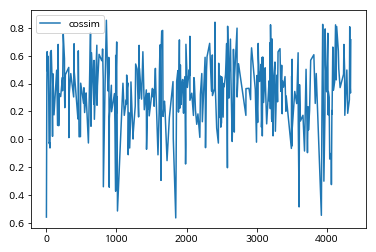

In [40]:
f_role.plot.line()

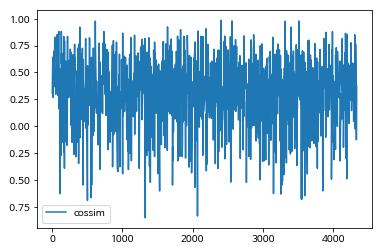

In [41]:
f_doll.plot.line()

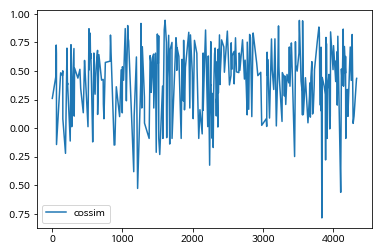

In [42]:
f_adornment.plot.line()

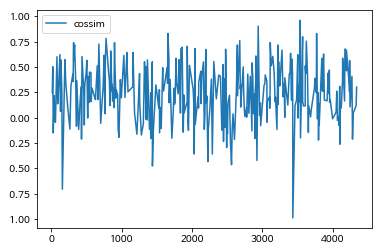

In [43]:
f_diy_hobby.plot.line()

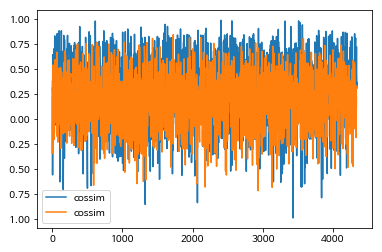

In [46]:
ax = df_female_no_error.plot.line()
df_male_no_error.plot.line(ax=ax)

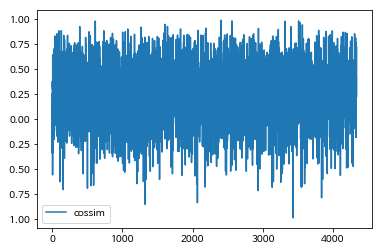

In [47]:
df_no_error.plot.line()

### cossim값이 가장 높거나 낮은 10개를 본다.

cossim이 가장 높은 10개는 모두 여아 장난감이다. 인형 카테고리가 6개로 가장 많고, 꾸미기(3개) - DIY/취미(1개) 순으로 많다.

In [73]:
# 전체 장난감 중 cossim 가장 높은 10개
cossim_highest_ten = df_no_error.sort_values(by=['cossim'], ascending=False, na_position='last').head(10)
cossim_highest_ten

,파일명,cossim
2407,C10100020002-8809243727123.png,0.985633
3512,C10100020002-L000001734554.png,0.979126
2561,C10100020002-L000002802504.png,0.979055
613,C10100020002-L000002802505.png,0.977806
3319,C10100020002-8809223826143.png,0.977236
3531,C10100020004-L000000528059.png,0.961744
1608,C10100020003-8809121092916.png,0.944416
3519,C10100020003-8809319382645.png,0.942967
3565,C10100020003-8809121094668.png,0.939253
1642,C10100020002-L000002709535.png,0.923838


In [68]:
# 여아 장난감 중 cossim 가장 높은 10개
cossim_f_highest_ten = df_female_no_error.sort_values(by=['cossim'], ascending=False, na_position='last').head(10)

In [74]:
# 남아 장난감 중 cossim 가장 높은 10개
cossim_m_highest_ten = df_male_no_error.sort_values(by=['cossim'], ascending=False, na_position='last').head(10)
cossim_m_highest_ten

,파일명,cossim
1723,C10100030003-L000003377541.png,0.840778
2116,C10100030004-L000000467977.png,0.812554
1956,C10100030005-L000002749607.png,0.811229
1429,C10100030003-8807099011861.png,0.804042
3579,C10100030002-L000000467770.png,0.803496
1025,C10100030005-4549660005858.png,0.767161
1350,C10100030005-4904810824534.png,0.763432
642,C10100030002-8809556745081.png,0.763352
634,C10100030005-4718006552374.png,0.763097
2898,C10100030005-4543112581037.png,0.760927


- cossim이 가장 낮은 10개는 여아 7개, 남아 3개로 여아가 더 많다.  
카테고리별로는 여아-인형이 4개로 가장 많고 그 다음으로 여아-DIY/취미(2개) 가 많다.  
나머지는 여아-꾸미기, 남아-액션, 남아-조종, 남아-프라모델/피규어가 모두 1개로 같다.

In [82]:
# 전체 장난감 중 cossim 가장 낮은 10개 
cossim_lowest_ten = df_no_error.sort_values(by=['cossim'], ascending=True, na_position='last').head(10)
cossim_lowest_ten

,파일명,cossim
3431,C10100020004-L000000528061.png,-0.987428
1325,C10100020002-8809243728397.png,-0.852873
2069,C10100020002-L000002665567.png,-0.835401
3839,C10100020003-L000000528754.png,-0.786606
2932,C10100030005-4549660144816.png,-0.714828
156,C10100020004-L000000528057.png,-0.704705
501,C10100020002-L000001459131.png,-0.690405
3134,C10100030003-8809194422856.png,-0.681508
2179,C10100030002-8809318321423.png,-0.679316
3549,C10100020002-L000002282648.png,-0.678954


In [86]:
# 여아 장난감 중 cossim 가장 낮은 10개 
cossim_f_lowest_ten = df_female_no_error.sort_values(by=['cossim'], ascending=True, na_position='last').head(10)
cossim_f_lowest_ten

,파일명,cossim
3431,C10100020004-L000000528061.png,-0.987428
1325,C10100020002-8809243728397.png,-0.852873
2069,C10100020002-L000002665567.png,-0.835401
3839,C10100020003-L000000528754.png,-0.786606
156,C10100020004-L000000528057.png,-0.704705
501,C10100020002-L000001459131.png,-0.690405
3549,C10100020002-L000002282648.png,-0.678954
3559,C10100020002-8809413830547.png,-0.676708
553,C10100020002-L000001464427.png,-0.665058
3597,C10100020002-L000002533996.png,-0.646420


In [87]:
# 남아 장난감 중 cossim 가장 낮은 10개 
cossim_m_lowest_ten = df_male_no_error.sort_values(by=['cossim'], ascending=True, na_position='last').head(10)
cossim_m_lowest_ten

,파일명,cossim
2932,C10100030005-4549660144816.png,-0.714828
3134,C10100030003-8809194422856.png,-0.681508
2179,C10100030002-8809318321423.png,-0.679316
589,C10100030003-8809174579709.png,-0.660774
2059,C10100030004-L000000467913.png,-0.647880
1209,C10100030005-8809541560033.png,-0.645422
1299,C10100030004-L000002672923.png,-0.623977
1335,C10100030004-4904810347224.png,-0.606830
2482,C10100030001-8801198100082.png,-0.559322
1033,C10100030002-8809318320518.png,-0.530826


### 어떤 장난감들이 가장 높거나 낮은 cossim값을 가지고 있는지 보기 위해 해당 파일명을 리스트로 만들어준다.

In [70]:
cossim_highest_ten_l = cossim_highest_ten.파일명.tolist()
cossim_lowest_ten_l = cossim_lowest_ten.파일명.tolist()
cossim_f_highest_ten_l = cossim_f_highest_ten.파일명.tolist()
cossim_m_highest_ten_l = cossim_m_highest_ten.파일명.tolist()
cossim_f_lowest_ten_l = cossim_f_lowest_ten.파일명.tolist()
cossim_m_lowest_ten_l = cossim_m_lowest_ten.파일명.tolist()

### 상위/하위 장난감들을 이미지로 모아 본다.

위에서 본 대로 cossim이 가장 높은 10개는 모두 여아 장난감이다.  
전부 육안으로 보기에도 핑크톤의 장난감들이다.  
반면 남아 장난감의 상위 10개는 핑크색뿐 아니라 빨강 혹은 무채색의 장난감들이 포함되어 있다.

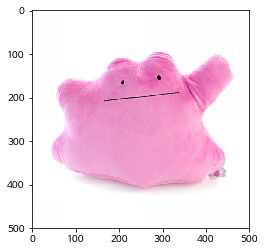

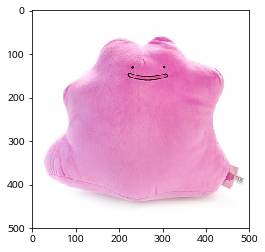

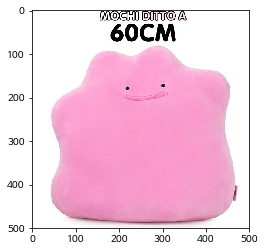

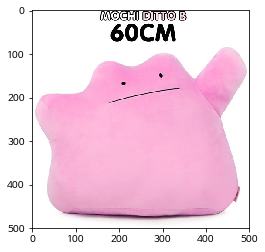

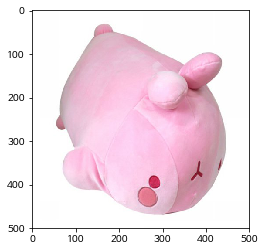

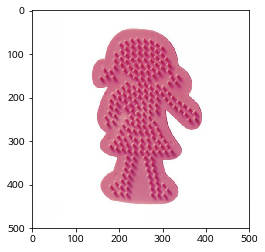

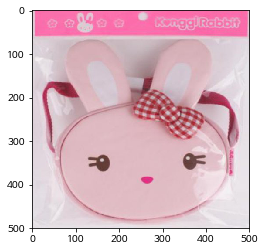

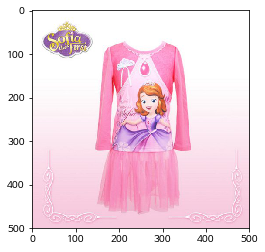

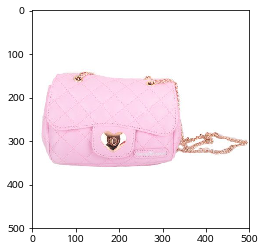

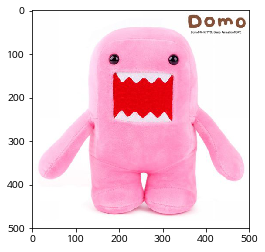

In [67]:
# 전체 상위 10개
def process(filename):
    image = mpimg.imread('../image/'+filename, 0)
    plt.figure()
    plt.imshow(image)
    
for file in cossim_highest_ten_l:
    process(file)

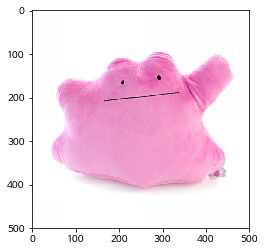

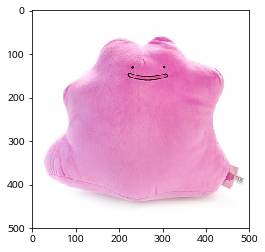

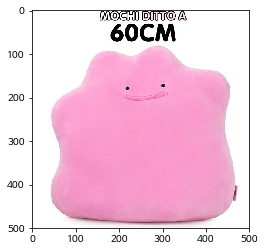

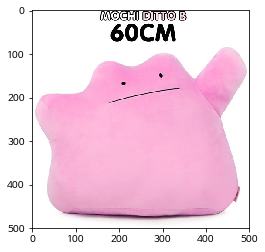

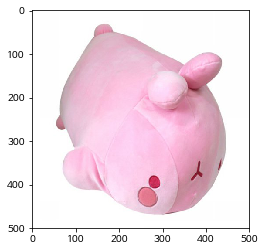

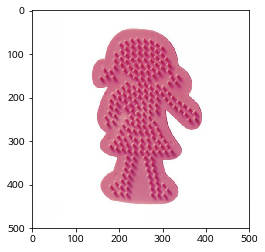

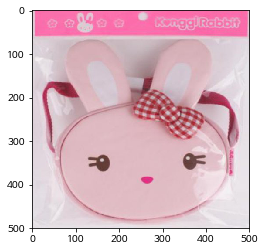

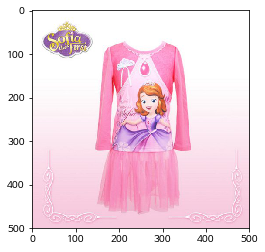

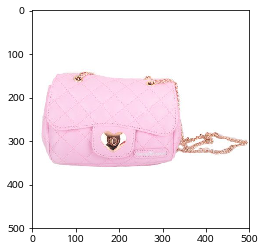

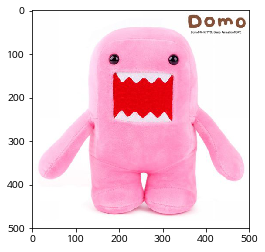

In [71]:
# 여아 상위 10개. 전체와 같음
def process(filename):
    image = mpimg.imread('../image/'+filename, 0)
    plt.figure()
    plt.imshow(image)
    
for file in cossim_f_highest_ten_l:
    process(file)

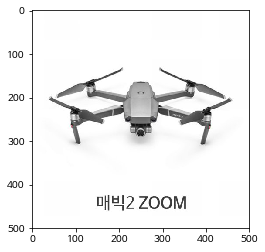

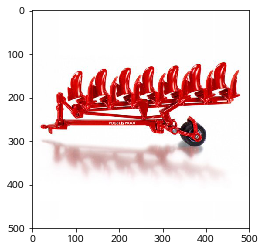

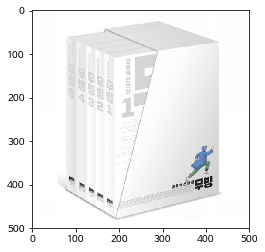

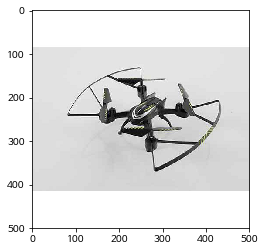

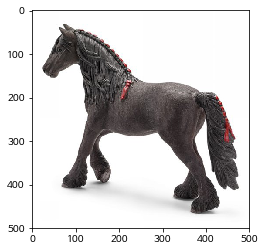

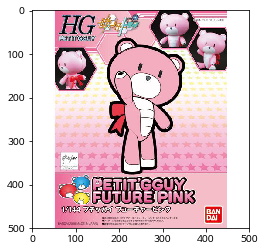

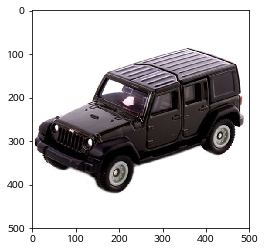

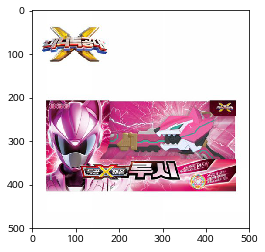

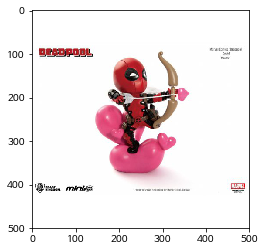

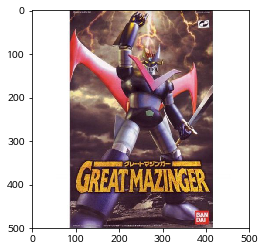

In [72]:
# 남아 상위 10개
def process(filename):
    image = mpimg.imread('../image/'+filename, 0)
    plt.figure()
    plt.imshow(image)
    
for file in cossim_m_highest_ten_l:
    process(file)

남아 장난감 상위 10개와 비슷한 cossim값을 가지고 있는 (약 0.76~0.84)여아 장난감들을 보기로 한다.

In [80]:
df_f_large = df_female_no_error[(df_female_no_error['cossim'] >= 0.76) & (df_female_no_error['cossim'] <= 0.84)]
df_f_large.shape

(102, 2)

102개나 됨!!

In [78]:
df_f_large_l = df_f_large.파일명.tolist()

/Users/yunkim/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


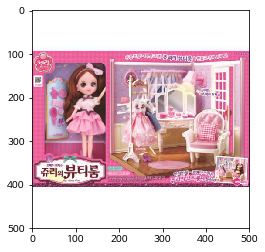

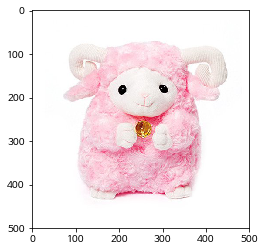

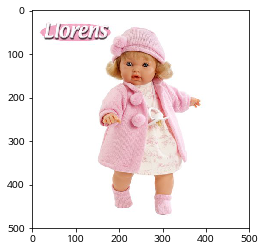

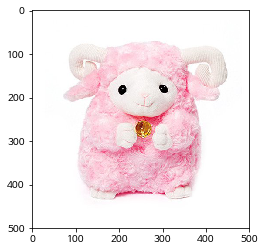

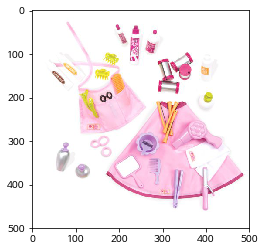

...

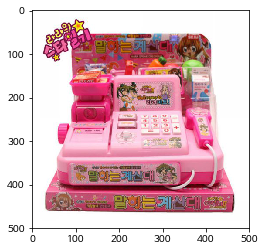

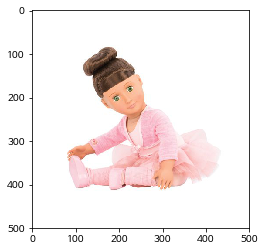

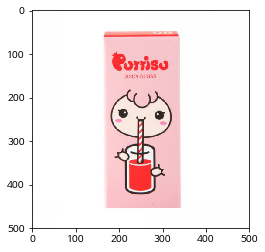

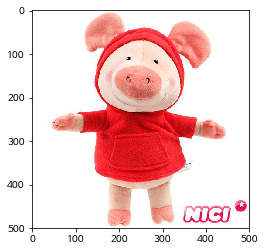

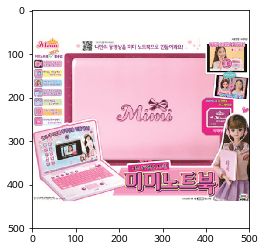

In [79]:
def process(filename):
    image = mpimg.imread('../image/'+filename, 0)
#     <something gets done here>
    plt.figure()
    plt.imshow(image)
    
for file in df_f_large_l:
    process(file)

빨강 톤이 들어간 장난감들이 있는 것은 비슷한 값의 남아 장난감과 같다. 
하지만 무채색의 장난감들은 없다.

**하위 10개는 그린-옅은 블루-무채색 계열로, 이 점은 여아/남아 둘 다 동일하다.**  
여아 장난감의 하위 10개는 인형이 대부분(7개)인 점이 눈에 띄고,  
남아 장난감은 비교적 다양하다(역할놀이-1, 액션-2, 조종-2, 자동차/기차-3, 프라모델/피규어-2).  
(카테고리 갯수 자체도 남아 장난감이 하나 더 많다)

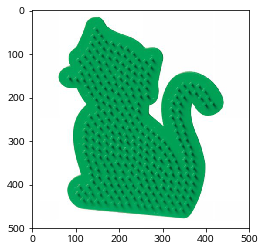

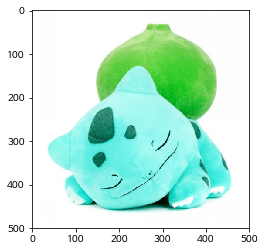

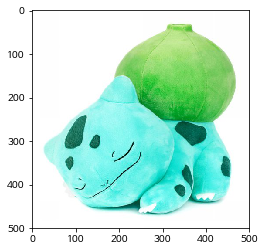

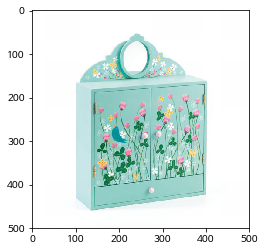

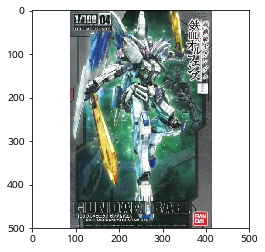

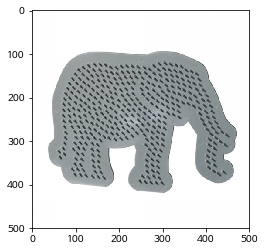

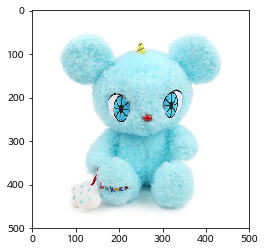

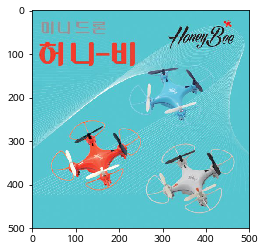

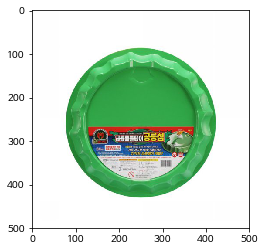

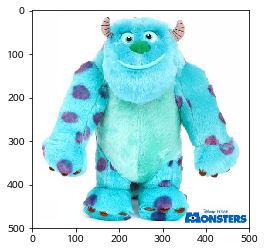

In [65]:
# 전체 하위 10개
def process(filename):
    image = mpimg.imread('../image/'+filename, 0)
    plt.figure()
    plt.imshow(image)
    
for file in cossim_lowest_ten_l:
    process(file)

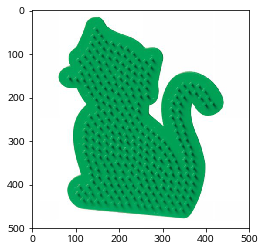

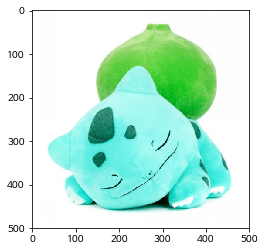

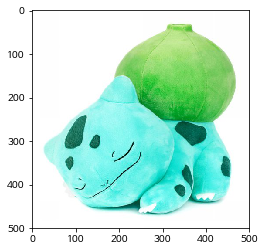

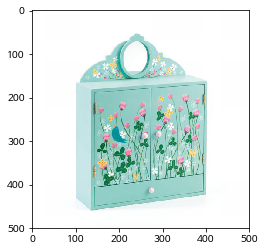

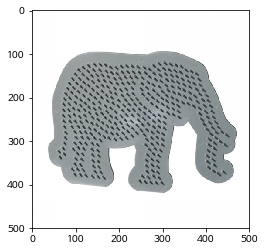

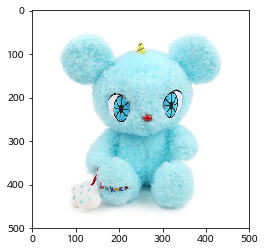

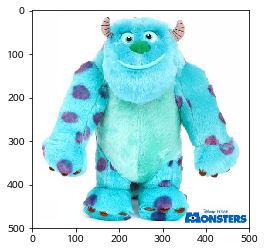

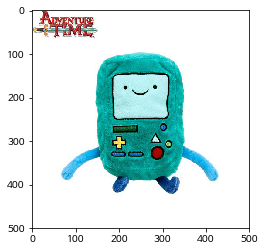

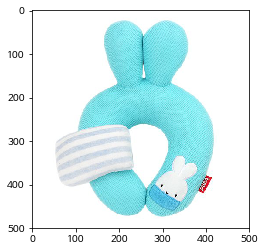

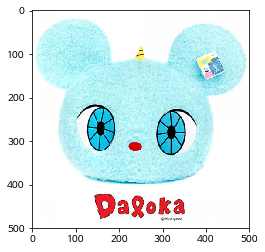

In [54]:
# 여아 하위 10개
def process(filename):
    image = mpimg.imread('../image/'+filename, 0)
    plt.figure()
    plt.imshow(image)
    
for file in cossim_f_lowest_ten_l:
    process(file)

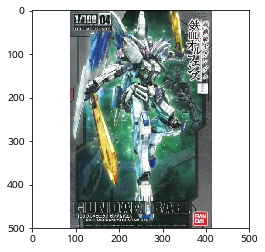

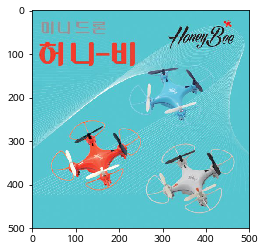

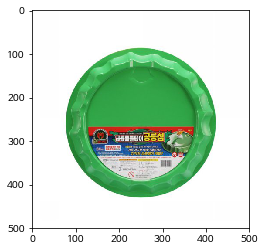

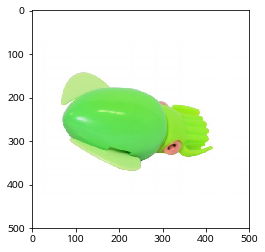

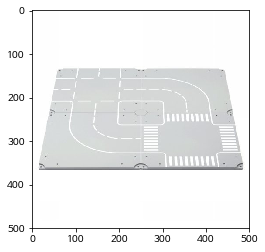

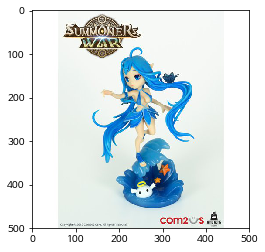

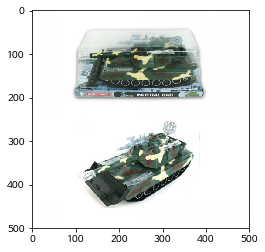

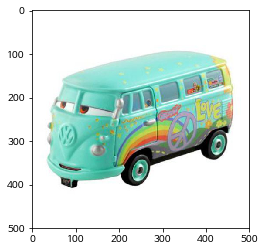

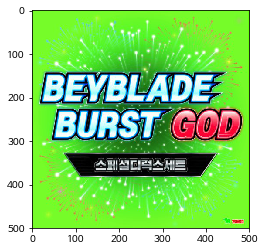

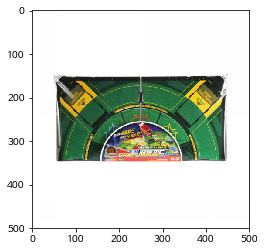

In [57]:
# 남아 하위 10개
def process(filename):
    image = mpimg.imread('../image/'+filename, 0)
#     <something gets done here>
    plt.figure()
    plt.imshow(image)
    
for file in cossim_m_lowest_ten_l:
    process(file)

In [150]:
df_large = df_no_error[df_no_error['cossim'] > 0.75]

In [152]:
df_large.shape

(172, 2)

In [7]:
# images = os.listdir('../image/')

In [141]:
# pink_hue = 328 / 360 * np.pi * 2

In [84]:
# from PIL import Image
# img = Image.open('../image/C10100020002-8809243727123.png')
# img2 = Image.open('../image/C10100020002-L000001459131.png')

# img.thumbnail((64, 64), Image.ANTIALIAS) # resizes image in-place
# # imgplot = plt.imshow(img)
# imgplot = plt.imshow(img2)

In [83]:
# w=10
# h=10
# fig=plt.figure(figsize=(8, 8))
# columns = 4
# rows = 5
# for i in range(1, columns*rows +1):
#     img = images[0:10]  #np.random.randint(10, size=(h,w))
#     fig.add_subplot(rows, columns, i)
#     plt.imshow(img)
# plt.show()